# SoundCloud: Audio Feature Extraction

Potential libraries:
 - https://github.com/FFmpeg/FFmpeg (12,573 stars)
 - https://github.com/librosa/librosa (2,254 stars)
 - https://github.com/tyiannak/pyAudioAnalysis (1,857 stars)
 - https://github.com/aubio/aubio (1,047 stars)
 - https://github.com/MTG/essentia (964 stars)
 - https://github.com/jamiebullock/LibXtract/ (161 stars)
 - https://github.com/Yaafe/Yaafe (140 stars)
 - https://github.com/jaron/deep-listening (72 stars) <- not really feature extraction

Notes:
 - see if you can find a pre-trained model (relevant to training conv net, not feature extraction)
     - or consider pre-training the model on the Million Song Dataset (MSD)
 - report after trying to classify bird song: https://github.com/jaron/deep-listening/blob/master/ProjectReport.pdf

In [1]:
import os
from glob import glob
from copy import deepcopy
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from pydub import AudioSegment
import pylab
import librosa
import librosa.display

% matplotlib inline

## Convert *Songs* from STEREO `.ftype` to MONO `.wav`

In [4]:
ROOT = 'audio/downloaded_songs/'
read_path = ROOT + 'original/'
write_path = ROOT + 'wav/'

In [3]:
def get_ftypes_in_orig_music(ignore = []):
    unsupported = ['m4a']
    ignore = list(set(ignore + unsupported + ['DS_Store', 'jpg', 'png']))
    return ['.{}'.format(t) for t in list(set([fname.split('.')[-1] for fname in
                      [item for sublist in [s[2] for s in [p for p in os.walk(read_path)]]
                       for item in sublist]])) if t not in ignore]

def get_orig_music_by_type(read_path, ftype):
    return {f[0].split('/original/')[1]: [s for s in f[2] if ftype in s]
            for f in [p for p in os.walk(read_path)] if len(f[0].split('/original/')[1]) > 0
           }

In [4]:
# build data object
orig_files = {}
for ftype in get_ftypes_in_orig_music():
    orig_files[ftype] = {artist: songs for artist, songs in
                         get_orig_music_by_type(read_path, ftype).items() if len(songs) > 0}

# convert all new songs
for ftype in orig_files.keys():
    print('FILE TYPE:', ftype)
    orig_artists_and_songs = deepcopy(orig_files[ftype])
    
    # loop through each artist and their songs
    for artist in orig_artists_and_songs.keys():
        print('\nStarting:', artist)
        for song in orig_artists_and_songs[artist]:
            
            # check if song is already converted
            artist_song_path = '{}/{}'.format(artist, song).replace('.mp3', '')
            if not os.path.isfile(write_path + artist_song_path + '.wav'):

                # create AudioSegment object
                print('Converting:', song)
                if ftype == '.mp3':
                    sound = AudioSegment.from_mp3(read_path + artist_song_path + ftype)

                # create new dir if needed (new converted (wav) artist)
                write_dir = write_path + artist
                if not os.path.exists(write_dir):
                    os.makedirs(write_dir)

                # convert to .wav
                export_path = write_dir + '/{}'.format(song.replace(ftype, '.wav'))
                sound.export(export_path, format = 'wav')
                
                # convert to mono (can only be done from wav format)
                sound = AudioSegment.from_wav(export_path)
                sound = sound.set_channels(1)
                sound.export(export_path, format = 'wav')

            else: print('Already converted...')

FILE TYPE: .mp3

Starting: ben_howard
Converting: 01 Old Pine.mp3
Converting: 02 Diamonds.mp3
Converting: 03 The Wolves.mp3
Converting: 04 Everything.mp3
Converting: 05 Only Love.mp3
Converting: 06 The Fear.mp3
Converting: 07 Keep Your Head Up.mp3
Converting: 08 Black Flies.mp3
Converting: 09 Gracious.mp3
Converting: 10 Promise.mp3

Starting: bob moses
Converting: 01.Like It Or Not.mp3
Converting: 02.Talk.mp3
Converting: 03.Before I Fall.mp3
Converting: 04.Too Much Is Never Enough.mp3
Converting: 05.Tearing Me Up.mp3
Converting: 06.Keeping Me Alive.mp3
Converting: 07.Nothing At All.mp3
Converting: 08.Days Gone By.mp3
Converting: 09.Writing On The Wall.mp3
Converting: 10.Touch & Go.mp3

Starting: bon_iver
Converting: 01 - Perth.mp3
Converting: 01 Flume.mp3
Converting: 02 - Minnesota, WI.mp3
Converting: 02 Lump Sum.mp3
Converting: 03 - Holocene.mp3
Converting: 03 Skinny Love.mp3
Converting: 04 - Towers.mp3
Converting: 04 The Wolves (Act I and II).mp3
Converting: 05 - Michicant.mp3
Conver

# Get Spectrogram of Songs

In [5]:
PATH = 'audio/downloaded_songs/wav/'

In [63]:
[i for i in os.walk(PATH)]

[('audio/downloaded_songs/wav/',
  ['ben_howard',
   'bob moses',
   'bon_iver',
   'caribou',
   'fleetwood_mac',
   'jose_gonzalez',
   'kendrick_lamar',
   'khalid',
   'lane_8',
   'moby',
   'nas',
   'rhcp',
   'rufus_du_sol',
   'the_xx',
   'zeds_dead'],
  ['.DS_Store']),
 ('audio/downloaded_songs/wav/ben_howard',
  [],
  ['01 Old Pine.wav',
   '02 Diamonds.wav',
   '03 The Wolves.wav',
   '04 Everything.wav',
   '05 Only Love.wav',
   '06 The Fear.wav',
   '07 Keep Your Head Up.wav',
   '08 Black Flies.wav',
   '09 Gracious.wav',
   '10 Promise.wav']),
 ('audio/downloaded_songs/wav/bob moses',
  [],
  ['01.Like It Or Not.wav',
   '02.Talk.wav',
   '03.Before I Fall.wav',
   '04.Too Much Is Never Enough.wav',
   '05.Tearing Me Up.wav',
   '06.Keeping Me Alive.wav',
   '07.Nothing At All.wav',
   '08.Days Gone By.wav',
   '09.Writing On The Wall.wav',
   '10.Touch & Go.wav']),
 ('audio/downloaded_songs/wav/bon_iver',
  [],
  ['01 - Perth.wav',
   '01 Flume.wav',
   '02 - Minneso

### **NOTE**: Currently I am using the songs as they are, they'd have to be clipped to a specific duration (which will also reduce computation cost)

In [19]:
'''
CODE FROM MEDIUM POST:
https://blog.manash.me/building-a-dead-simple-word-recognition-engine-using-convnet-in-keras-25e72c19c12b

pylab.axis('off') # no axis
pylab.axes([0., 0., 1., 1.], frameon=False, xticks=[], yticks=[]) # Remove the white edge
S = librosa.feature.melspectrogram(y=sig, sr=fs)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
pylab.savefig(save_path, bbox_inches=None, pad_inches=0)
pylab.close()
''';

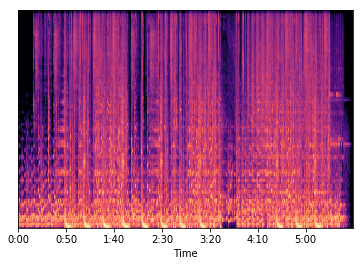

In [70]:
example_song = PATH + 'rufus_du_sol/Rufus Du Sol - Underwater.wav'

sig, fs = librosa.load(example_song)
S = librosa.feature.melspectrogram(y=sig, sr=fs)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis = 'time');

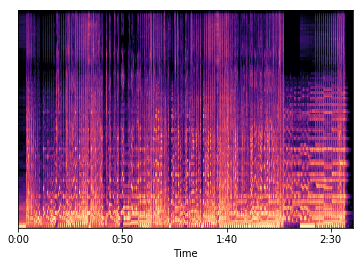

In [69]:
example_song_2 = PATH + 'the_xx/04 Islands.wav'

sig, fs = librosa.load(example_song_2)
S = librosa.feature.melspectrogram(y=sig, sr=fs)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis = 'time');

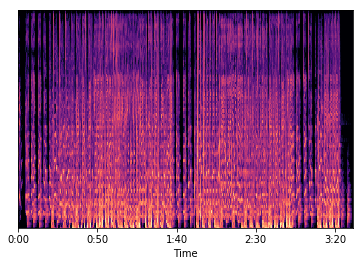

In [68]:
example_song_3 = PATH + 'kendrick_lamar/10 LOVE. (FEAT. ZACARI.).wav'

sig, fs = librosa.load(example_song_3)
S = librosa.feature.melspectrogram(y=sig, sr=fs)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max), x_axis = 'time');

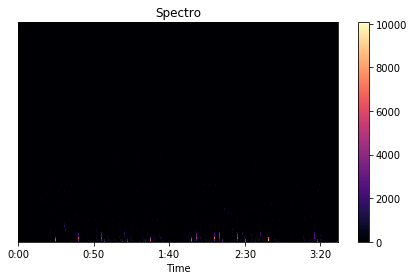

In [67]:
librosa.display.specshow(S, x_axis='time')
plt.colorbar()
plt.title('Spectro')
plt.tight_layout()

# Get MFCC of Song

In [71]:
wave, sr = librosa.load(example_song, # path to song
                        sr = None     # None uses the native sample rate
                       )

In [57]:
# downsample
#wave = wave[::3]

In [53]:
#mfcc = librosa.feature.mfcc(wave, sr = 16000)
mfcc.shape

(20, 30088)

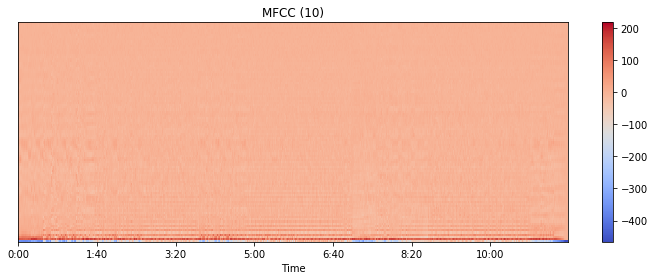

In [77]:
mfcc = librosa.feature.mfcc(y = wave, sr = sr, n_mfcc = 100)

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar()
plt.title('MFCC (10)')
plt.tight_layout()

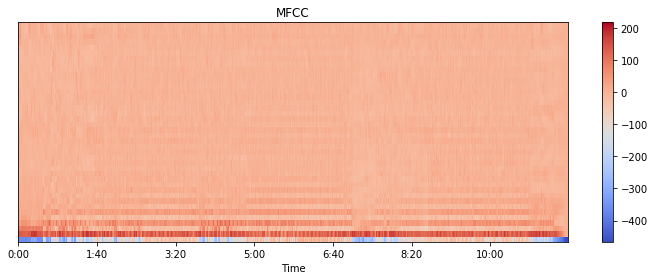

In [73]:
mfcc = librosa.feature.mfcc(y = wave, sr = sr, n_mfcc = 40)
mfcc.shape

plt.figure(figsize=(10, 4))
librosa.display.specshow(mfcc, x_axis='time')
plt.colorbar()
plt.title('MFCC (40)')
plt.tight_layout()

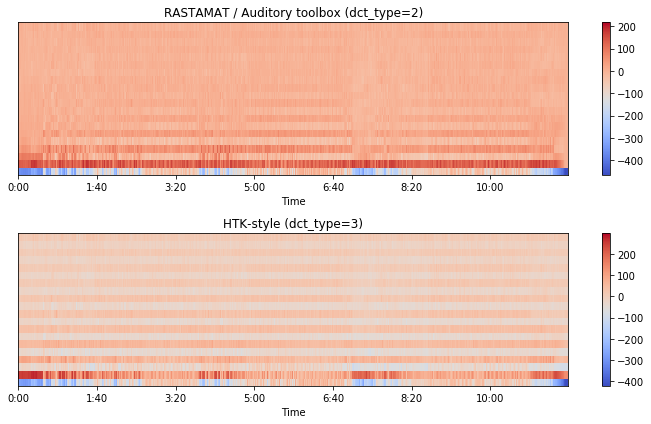

In [74]:
m_slaney = librosa.feature.mfcc(y=wave, sr=sr, dct_type=2)
m_htk = librosa.feature.mfcc(y=wave, sr=sr, dct_type=3)

plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)

librosa.display.specshow(m_slaney, x_axis='time')
plt.title('RASTAMAT / Auditory toolbox (dct_type=2)')
plt.colorbar()
plt.subplot(2, 1, 2)

librosa.display.specshow(m_htk, x_axis='time')
plt.title('HTK-style (dct_type=3)')
plt.colorbar()
plt.tight_layout()

# Source Seperation

In [2]:
PATH = 'audio/downloaded_songs/wav/'

In [3]:
example_song = PATH + 'rufus_du_sol/Rufus Du Sol - Underwater.wav'

# load 60 second clip
y, sr = librosa.load(example_song, duration = 60)

# compute the short-time Fourier transform of y
D = librosa.stft(y)

## Margin: 1.0 (No Residual)

In [8]:
# decompose D into harmonic and percussive components
D_harmonic, D_percussive = librosa.decompose.hpss(D)

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


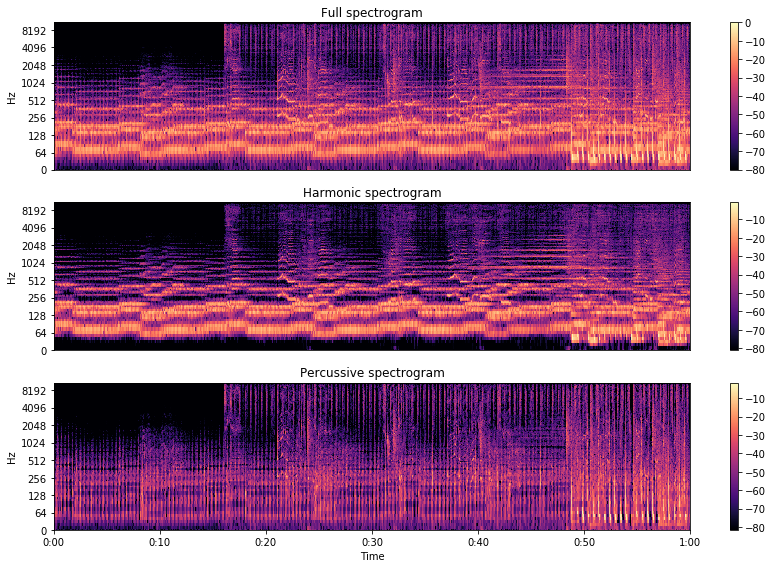

In [9]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(D_harmonic, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(D_percussive, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

In [10]:
y_harm = librosa.core.istft(D_harmonic)
y_perc = librosa.core.istft(D_percussive)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_nr.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_nr.wav', y_perc, sr)

## Margin: 3.0

In [46]:
H, P = librosa.decompose.hpss(D, margin=3.0)
R = D - (H+P)

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


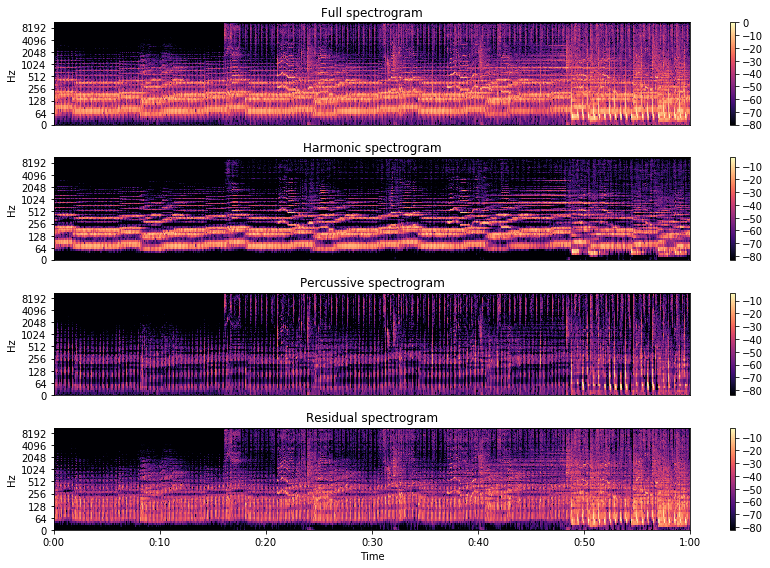

In [47]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(H, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(P, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(R, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Residual spectrogram')
plt.tight_layout()

In [50]:
y_harm = librosa.core.istft(H)
y_perc = librosa.core.istft(P)
y_resi = librosa.core.istft(R)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_m3.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_m3.wav', y_perc, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_residual_m3.wav', y_resi, sr)

## Margin: 5.0

In [12]:
H, P = librosa.decompose.hpss(D, margin = 5.0)
R = D - (H+P)

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


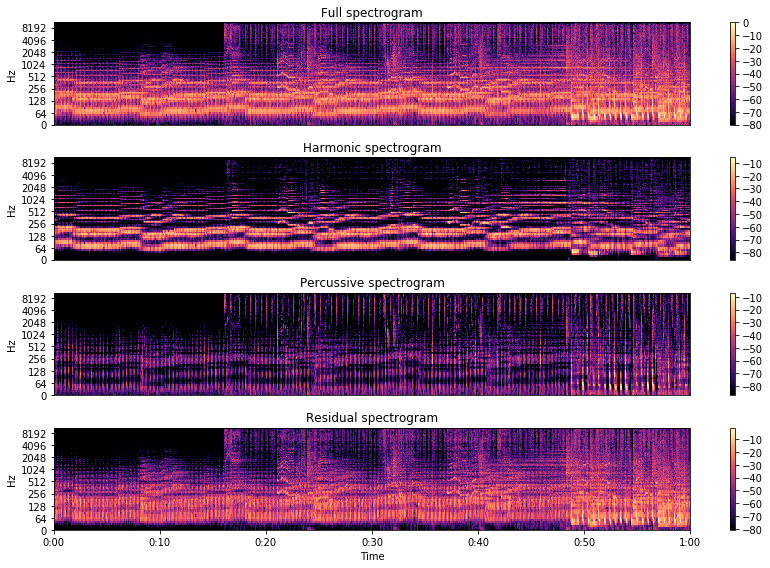

In [13]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(H, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(P, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(R, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Residual spectrogram')
plt.tight_layout()

In [14]:
y_harm = librosa.core.istft(H)
y_perc = librosa.core.istft(P)
y_resi = librosa.core.istft(R)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_m5.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_m5.wav', y_perc, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_residual_m5.wav', y_resi, sr)

## Margin: 10.0

In [15]:
H, P = librosa.decompose.hpss(D, margin = 5.0)
R = D - (H+P)

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


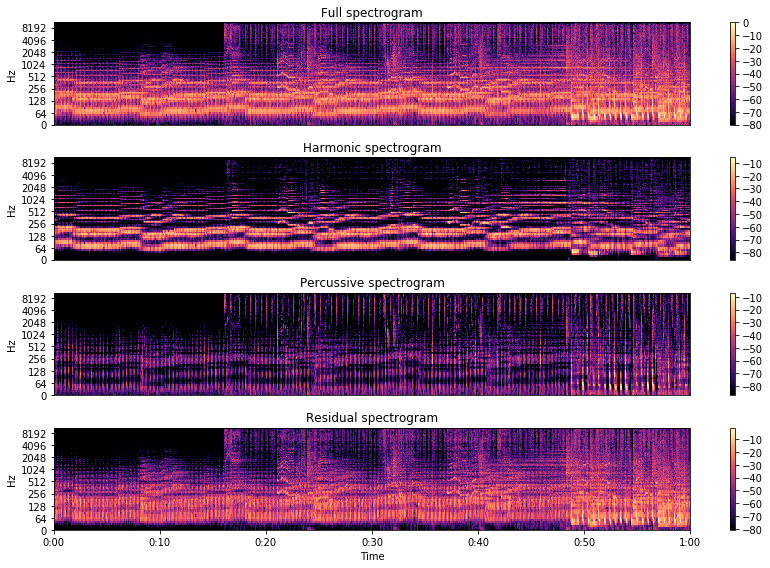

In [16]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(H, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(P, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(R, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Residual spectrogram')
plt.tight_layout()

In [17]:
y_harm = librosa.core.istft(H)
y_perc = librosa.core.istft(P)
y_resi = librosa.core.istft(R)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_m10.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_m10.wav', y_perc, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_residual_m10.wav', y_resi, sr)

## Margin (range): 1.0 - 5.0

In [5]:
H, P = librosa.decompose.hpss(D, margin=(1.0, 5.0))
R = D - (H+P)

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


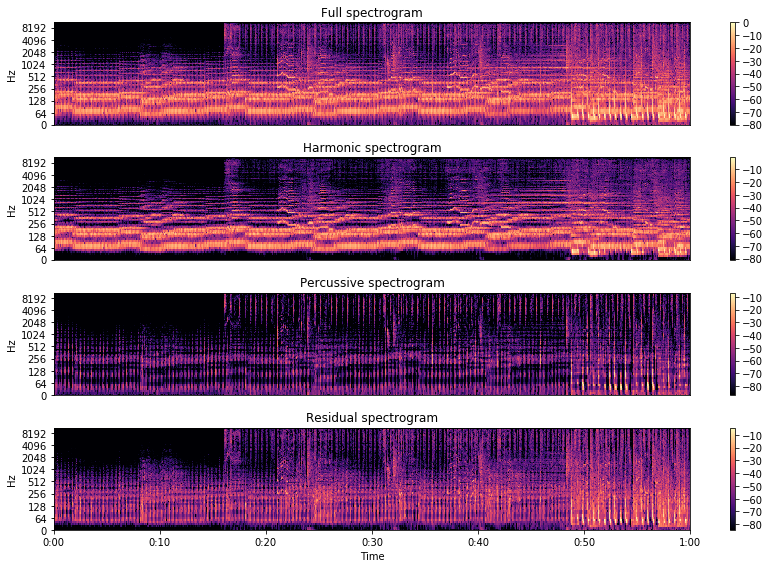

In [6]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(H, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(P, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

plt.subplot(4, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(R, ref=rp), y_axis='log', x_axis='time')
plt.colorbar()
plt.title('Residual spectrogram')
plt.tight_layout()

In [7]:
y_harm = librosa.core.istft(H)
y_perc = librosa.core.istft(P)
y_resi = librosa.core.istft(R)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_m1-5.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_m1-5.wav', y_perc, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_residual_m1-5.wav', y_resi, sr)

## Harmonic-Percussive Source Seperation (HPSS) Notes:

From listening to the example track, it seems that the algorithm works best when the margin is set to 1 (the default). When there is residual, it pulls in too much from both the Harmonic and Percussive elements -- making it not much use the goal of creating a more granular Spectrogram.

## Vocal Separation

In [18]:
example_song = PATH + 'rufus_du_sol/Rufus Du Sol - Underwater.wav'

# load 60 second clip
y, sr = librosa.load(example_song, duration = 60)

In [19]:
# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y))

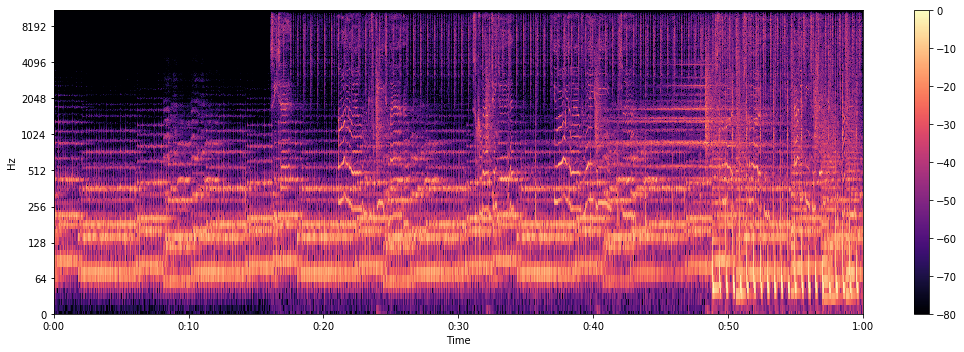

In [22]:
plt.figure(figsize=(15, 5))
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


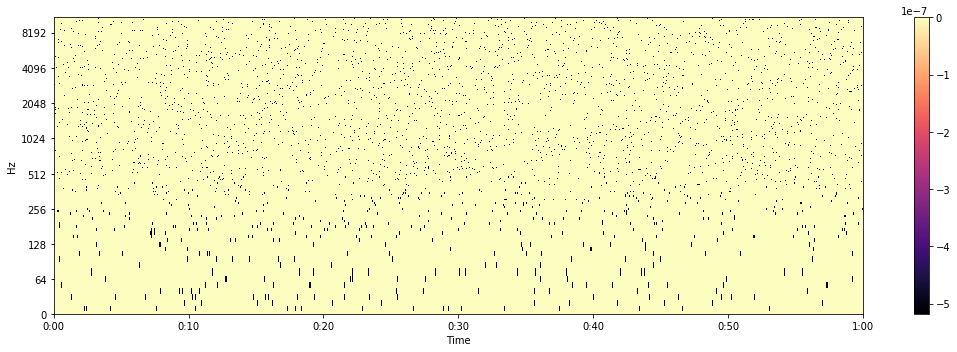

In [28]:
plt.figure(figsize=(15, 5))
librosa.display.specshow(librosa.amplitude_to_db(phase, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

In [23]:
# We'll compare frames using cosine similarity, and aggregate similar frames
# by taking their (per-frequency) median value.
#
# To avoid being biased by local continuity, we constrain similar frames to be
# separated by at least 2 seconds.
#
# This suppresses sparse/non-repetetitive deviations from the average spectrum,
# and works well to discard vocal elements.

S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))

# The output of the filter shouldn't be greater than the input
# if we assume signals are additive.  Taking the pointwise minimium
# with the input spectrum forces this.
S_filter = np.minimum(S_full, S_filter)

## Margin: 2, 10

In [67]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation
margin_i, margin_v = 2, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

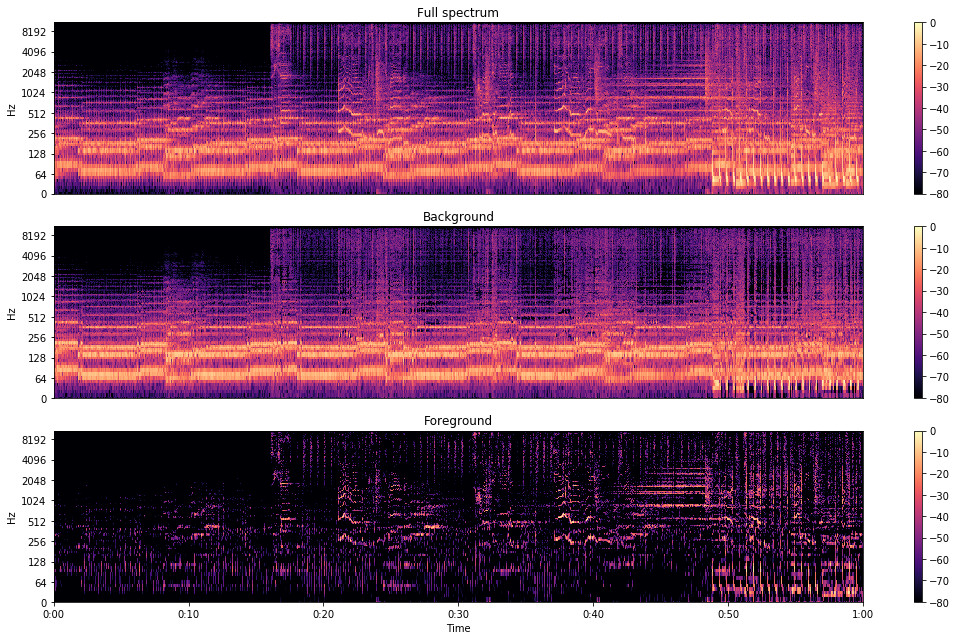

In [68]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [69]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,10.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,10.wav', y_foreground, sr)

In [70]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,10.wav')

In [71]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,10.wav')

## Margin: 1, 1

In [32]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 1, 1
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

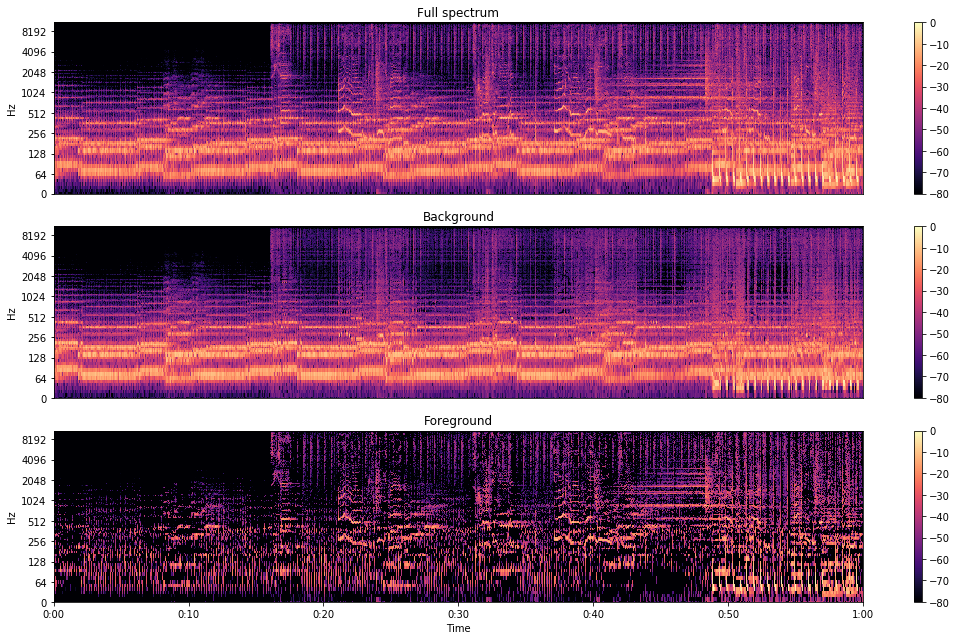

In [33]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [35]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m1.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m1.wav', y_foreground, sr)

In [36]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m1.wav')

In [37]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m1.wav')

## Margin: 2, 2

In [39]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 2, 2
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

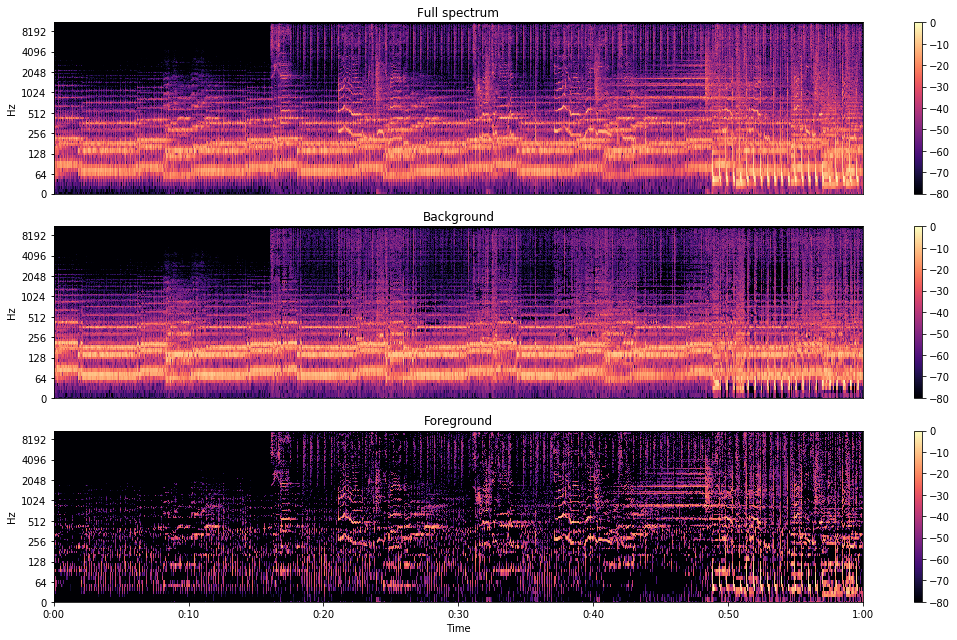

In [40]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [41]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2.wav', y_foreground, sr)

In [42]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2.wav')

In [43]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2.wav')

## Margin: 2, 5

In [44]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 2, 5
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

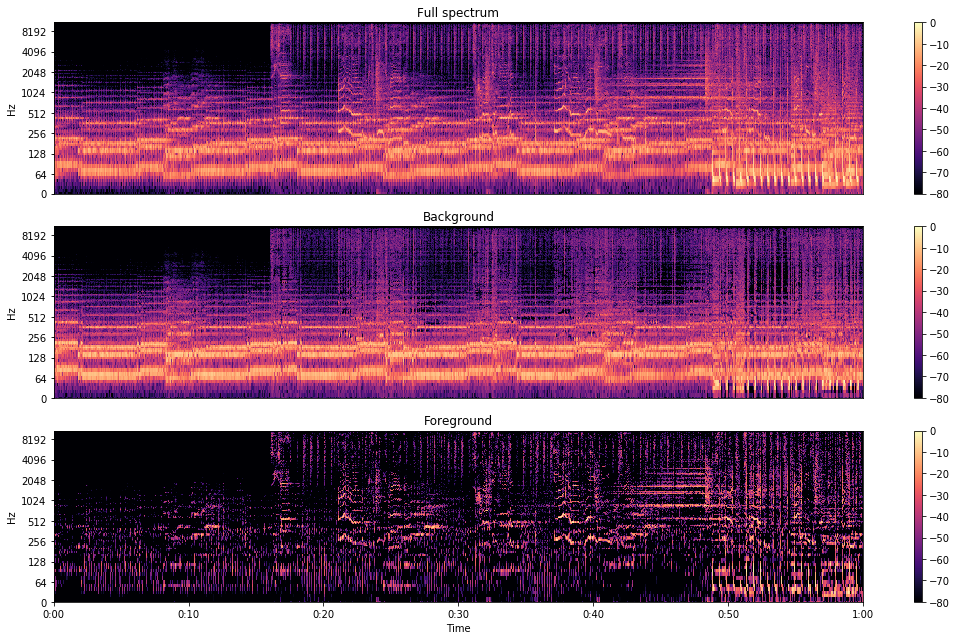

In [45]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [46]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,5.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,5.wav', y_foreground, sr)

In [47]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,5.wav')

In [48]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,5.wav')

## Margin: 5, 5

In [50]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 5, 5
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

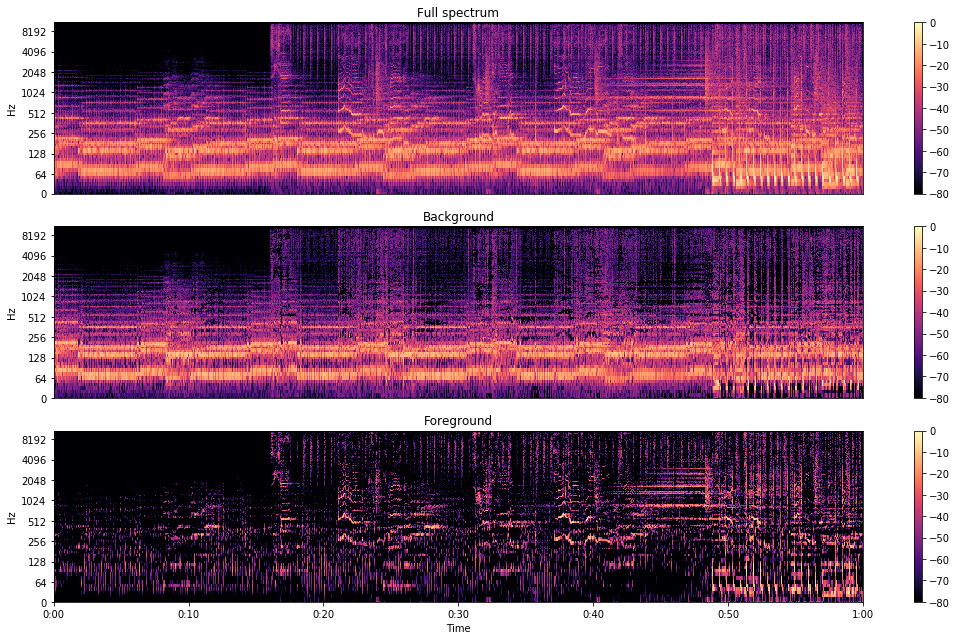

In [51]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [52]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m5,5.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m5,5.wav', y_foreground, sr)

In [53]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m5,5.wav')

In [54]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m5,5.wav')

## Margin: 10, 10

In [55]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 10, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

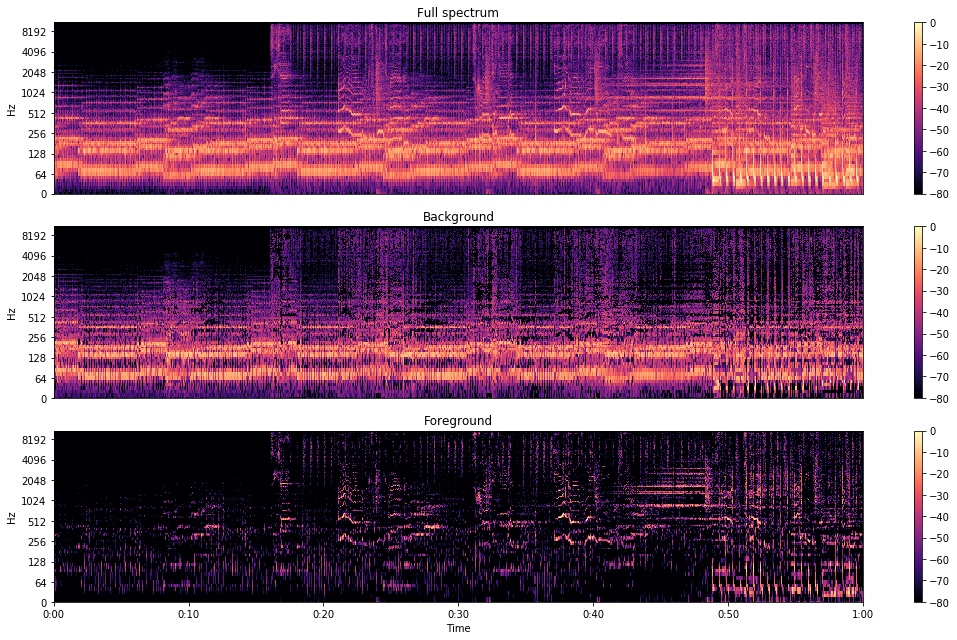

In [56]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [57]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m10,10.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m10,10.wav', y_foreground, sr)

In [58]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m10,10.wav')

In [59]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m10,10.wav')

## Margin: 2, 15

In [60]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 2, 15
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

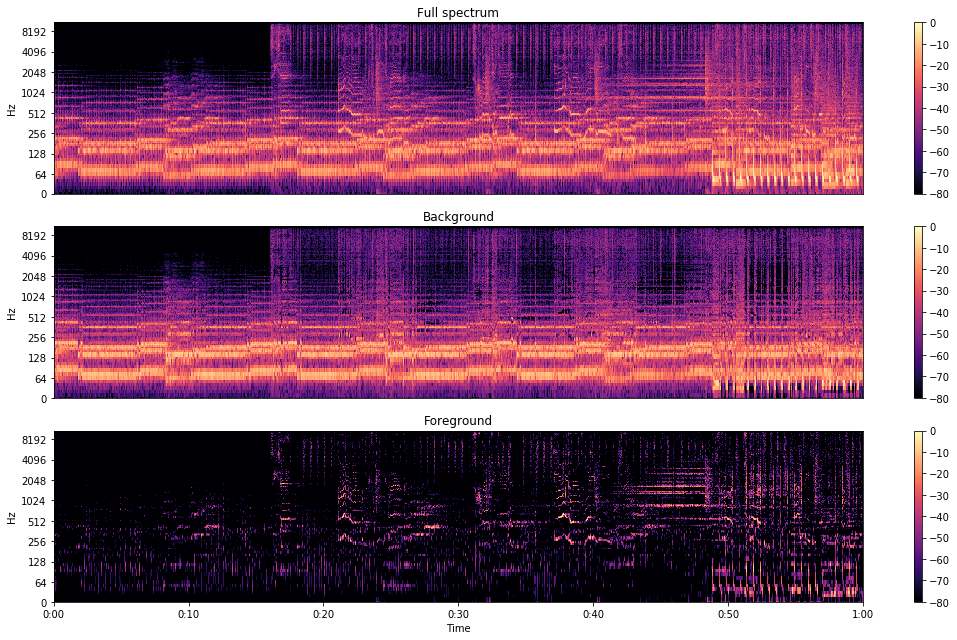

In [61]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [64]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,15.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,15.wav', y_foreground, sr)

In [65]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m2,15.wav')

In [66]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m2,15.wav')

## Margin: 0, 10

In [72]:
# We can also use a margin to reduce bleed between the vocals and instrumentation masks.
# Note: the margins need not be equal for foreground and background separation

# margin_i, margin_v = 2, 10 # ORIGINAL
margin_i, margin_v = 0, 10
power = 2

mask_i = librosa.util.softmask(S_filter,
                               margin_i * (S_full - S_filter),
                               power=power)

mask_v = librosa.util.softmask(S_full - S_filter,
                               margin_v * S_filter,
                               power=power)

# Once we have the masks, simply multiply them with the input spectrum
# to separate the components

S_foreground = mask_v * S_full
S_background = mask_i * S_full

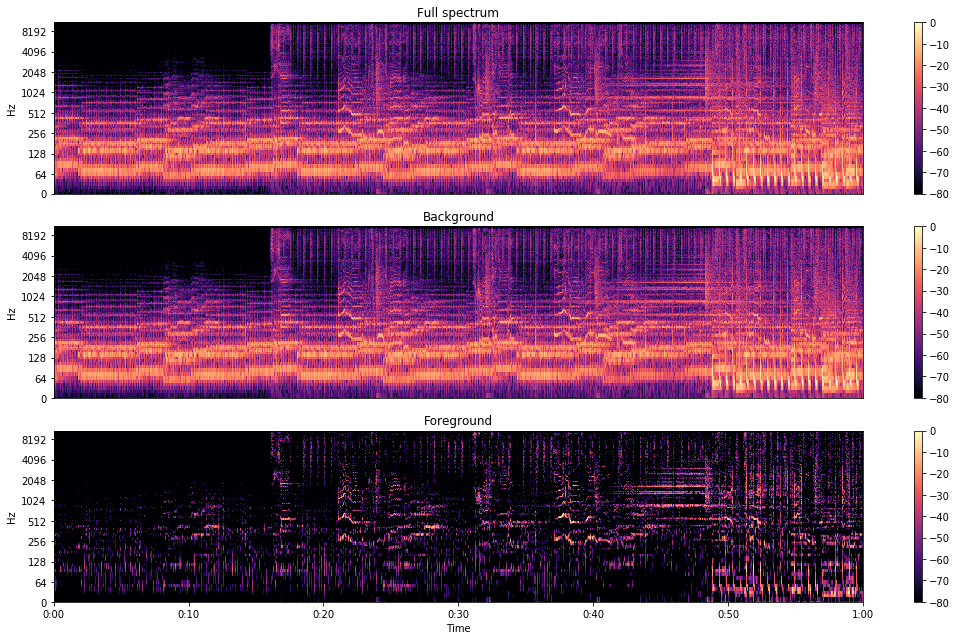

In [73]:
# sphinx_gallery_thumbnail_number = 2

plt.figure(figsize=(15, 9))
plt.subplot(3, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Full spectrum')
plt.colorbar()

plt.subplot(3, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(3, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [74]:
y_background = librosa.core.istft(S_background)
y_foreground = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m0,10.wav', y_background, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m0,10.wav', y_foreground, sr)

In [75]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_background_m0,10.wav')

In [76]:
AudioSegment.from_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal-sep_foreground_m0,10.wav')

## Vocal Seperation Notes:

Better sounding margins:
 - (5,5): Vocals have the highest amplitude and keeps more of the harmonics. But there is a lot of bleed and when the song picks up you can hear a lot of the background music.
 - (2, 10) / (10, 10): I can't really hear much of a difference between the two... It might be worth trying on another track to see if there are any differences.
 - (2, 15): There is less background noise but the vocals seem to begin to lose some of their texture/harmonics (or less technically, they lose a bit of their magic)
 
Overall, I think it would be best to go with (2, 10) or (10, 10). There is actually no difference between the two when it comes to the vocals -- only the background is "brighter" when using a lower first margin (2). So this would only make a difference in the model if the background segment is used.

# Combine HPSS & VS

In [88]:
example_song = PATH + 'rufus_du_sol/Rufus Du Sol - Underwater.wav'

# load 60 second clip
y, sr = librosa.load(example_song, duration = 120)

In [89]:
# compute the short-time Fourier transform of y
D = librosa.stft(y)

# decompose D into harmonic and percussive components
D_harmonic, D_percussive = librosa.decompose.hpss(D)

# convert the harmonics to a 
y_harm = librosa.core.istft(D_harmonic)

In [90]:
# compute the spectrogram magnitude and phase **OF THE HARMONICS**
S_full, phase = librosa.magphase(librosa.stft(y_harm))

# create filter
S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate = np.median,
                                       metric = 'cosine',
                                       width = int(librosa.time_to_frames(2, sr=sr))
                                      )

S_filter = np.minimum(S_full, S_filter)

# create masks
margin_i, margin_v = 2, 10
power = 2
mask_i = librosa.util.softmask(S_filter, margin_i * (S_full - S_filter), power = power)
mask_v = librosa.util.softmask(S_full - S_filter, margin_v * S_filter, power = power)

# apply mask
S_foreground = mask_v * S_full
S_background = mask_i * S_full

/anaconda3/lib/python3.6/site-packages/librosa/core/spectrum.py:960: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  warnings.warn('amplitude_to_db was called on complex input so phase '


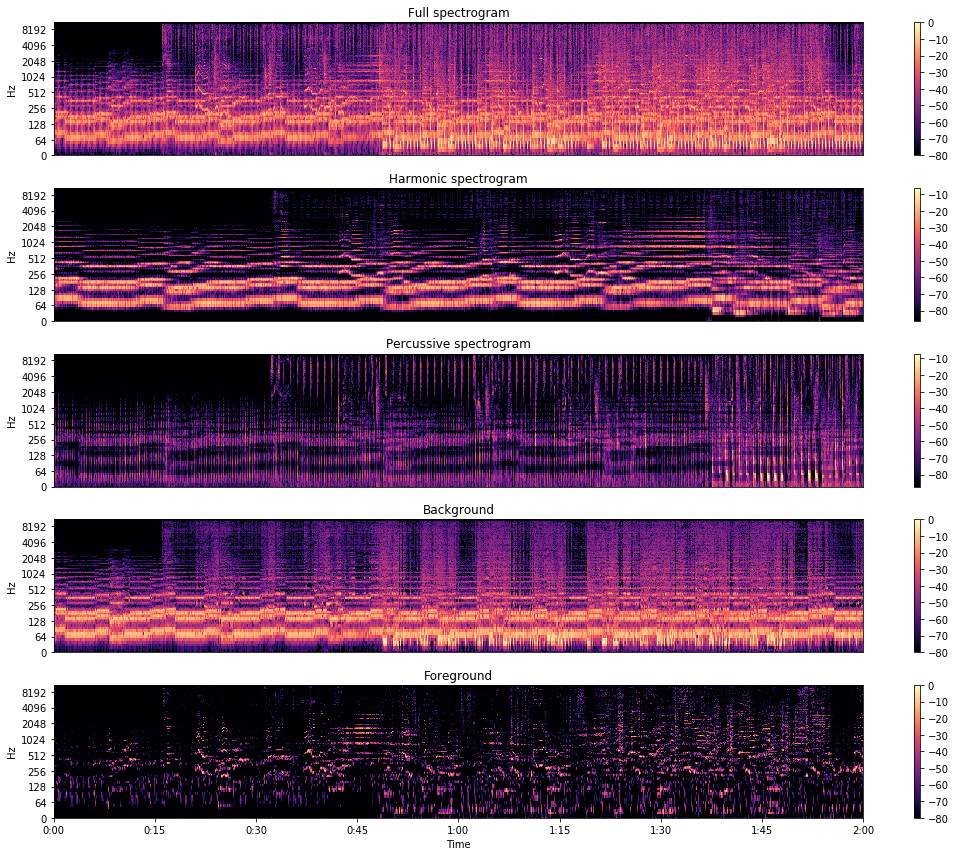

In [92]:
# Pre-compute a global reference power from the input spectrum
rp = np.max(np.abs(D))

plt.figure(figsize=(15, 12))

plt.subplot(5, 1, 1)
librosa.display.specshow(librosa.amplitude_to_db(D, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Full spectrogram')

plt.subplot(5, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(H, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Harmonic spectrogram')

plt.subplot(5, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(P, ref=rp), y_axis='log')
plt.colorbar()
plt.title('Percussive spectrogram')
plt.tight_layout()

plt.subplot(5, 1, 4)
librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                         y_axis='log', sr=sr)
plt.title('Background')
plt.colorbar()
plt.subplot(5, 1, 5)
librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.title('Foreground')
plt.colorbar()
plt.tight_layout()
plt.show()

In [93]:
y_harm = librosa.core.istft(D_harmonic)
y_perc = librosa.core.istft(D_percussive)
y_voca = librosa.core.istft(S_foreground)

librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_harmonic_FINAL.wav', y_harm, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_percussive_FINAL.wav', y_perc, sr)
librosa.output.write_wav('audio/downloaded_songs/manipulated/rufus_underwater_vocal_FINAL.wav', y_voca, sr)